In [1]:
%reset -f

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib import rcParams, cm
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib._color_data as mcd
import matplotlib.patches as mpatch
from mpl_toolkits.mplot3d import Axes3D
from scipy import io, integrate
from sklearn import linear_model
import pickle
import os
import shutil
from Equations import LorenzEquation, LorenzFixedPoints, LorenzSphere, LorenzEllipsoid
from utilities import centralSchemeDerivative

import tensorflow as tf
from tensorflow.python import keras
from tensorflow.python.keras import layers, Input

import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling

from plot_keras_history import plot_history

path = '.'#os.path.dirname(os.path.realpath(__file__))
path_data = os.path.join(path, 'data')
es3_p1_p1 = os.path.join(path_data, 'es3_partI_prediction1.mat')
es3_p1_p1_m = os.path.join(path_data, 'es3_partI_prediction1_more_rho.mat')
es3_p1_p2 = os.path.join(path_data, 'es3_partI_prediction2.mat')
es3_p1_p2_m = os.path.join(path_data, 'es3_partI_prediction2_more_rho.mat')

es3_p2_dir =  os.path.join(path, 'es3_partII')

if not os.path.exists(es3_p2_dir):
    os.makedirs(es3_p2_dir)


In [3]:
##  PART I - LOAD VARIABLES

dataset_p1 = io.loadmat(es3_p1_p1)
dataset_p1_m = io.loadmat(es3_p1_p1_m)

dataset_p2 = io.loadmat(es3_p1_p2)
dataset_p2_m = io.loadmat(es3_p1_p2_m)

dt = 0.01
t_end = 8
t = np.arange(0,t_end+dt,dt)


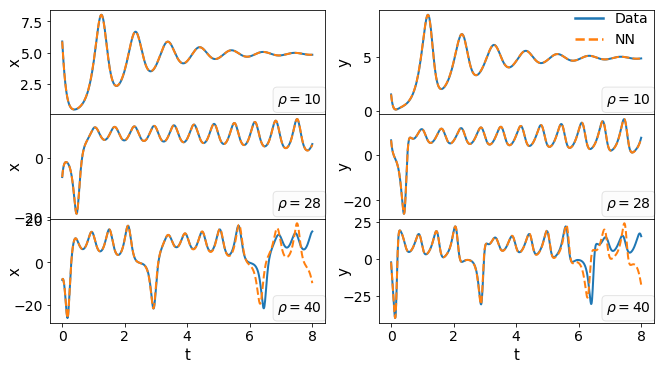

In [4]:
##  PREDICTION 1 - PLOT 1

X0 = dataset_p1['X0_check']
X = dataset_p1['X_nn_check']
X_pred = dataset_p1['X_nn_pred']
rho = [10,28,40]

fig_0, ax_0 = plt.subplots(3,2,figsize=1.3*plt.figaspect(0.56), tight_layout=True, sharex='all', sharey='none' ,gridspec_kw={'hspace': 0})

for i in range(X.shape[2]):
    if i == 0:
        ax_0[i,0].plot(t, X[:,0,i], '-', linewidth=2, label='Data')
        ax_0[i,0].plot(t, X_pred[:,0,i], '--', linewidth=2, label='NN')
        ax_0[i,1].plot(t, X[:,1,i], '-', linewidth=2)
        ax_0[i,1].plot(t, X_pred[:,1,i], '--', linewidth=2)
        #ax_0[i,0].set_title('')
    else:
        ax_0[i,0].plot(t, X[:,0,i], '-', linewidth=2)
        ax_0[i,0].plot(t, X_pred[:,0,i], '--', linewidth=2)
        ax_0[i,1].plot(t, X[:,1,i], '-', linewidth=2)
        ax_0[i,1].plot(t, X_pred[:,1,i], '--', linewidth=2)
        
    
    ax_0[i,0].tick_params(axis='y', labelsize=14)
    ax_0[i,1].tick_params(axis='y', labelsize=14)
    ax_0[i,0].tick_params(axis='x', labelsize=14)
    ax_0[i,1].tick_params(axis='x', labelsize=14)
    ylim0 = ax_0[i,0].get_ylim()
    ylim1 = ax_0[i,1].get_ylim()
    ax_0[i,0].set_ylabel(ylabel='x', fontsize=15)
    ax_0[i,0].get_yaxis().set_label_coords(-0.1,0.5)
    ax_0[i,1].set_ylabel(ylabel='y', fontsize=15)
    ax_0[i,1].get_yaxis().set_label_coords(-0.1,0.5)
        
    ax_0[i,0].annotate(r'$\rho = {}$'.format(rho[i]), xy=(8, ylim0[0]), \
        xytext=(-35,11), textcoords='offset points',color='k', fontsize=14, fontweight='bold', bbox=dict(boxstyle="round", fc="0.9", alpha=0.1))
    ax_0[i,1].annotate(r'$\rho = {}$'.format(rho[i]), xy=(8, ylim1[0]), \
    xytext=(-35,11), textcoords='offset pixels',color='k', fontsize=14, fontweight='bold', bbox=dict(boxstyle="round", fc="0.9", alpha=0.1))

ax_0[0,0].set_ylabel(ylabel='x', fontsize=15, labelpad=13)
ax_0[0,1].set_ylabel(ylabel='y', fontsize=15, labelpad=24)
ax_0[2,0].set_xlabel(xlabel='t', fontsize=15)
ax_0[2,1].set_xlabel(xlabel='t', fontsize=15)
leg = fig_0.legend( loc=[0.86,0.857], framealpha=0.0, fontsize=14, shadow=False, fancybox=False, markerscale=1.5,) #bbox_to_anchor=[0, 1],
leg_lines = leg.get_lines()
plt.setp(leg_lines, linewidth=2.5)
#fig_0.savefig('..\\report_latex\\es3.1_prediction_1.eps', transaprent=True)


plt.show()

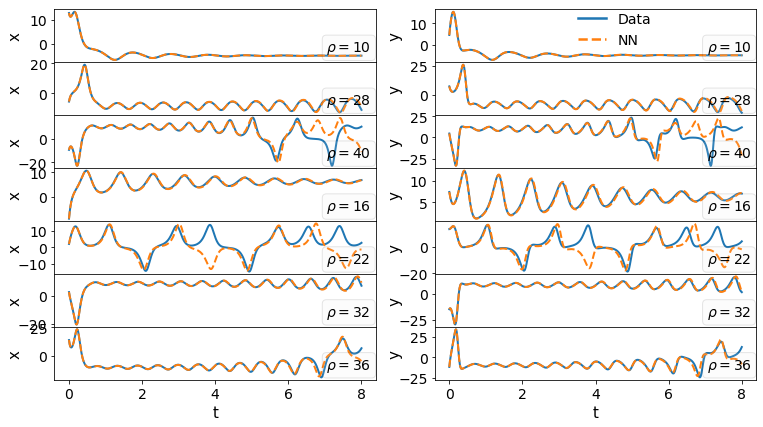

In [5]:
##  PREDICTION 1 - PLOT 2

X0 = dataset_p1_m['X0_check']
X = dataset_p1_m['X_nn_check']
X_pred = dataset_p1_m['X_nn_pred']
rho = [10,28,40,16,22,32,36]

fig_0, ax_0 = plt.subplots(X.shape[2],2,figsize=1.5*plt.figaspect(0.56), tight_layout=True, sharex='all', sharey='none' ,gridspec_kw={'hspace': 0})

for i in range(X.shape[2]):
    if i == 0:
        ax_0[i,0].plot(t, X[:,0,i], '-', linewidth=2, label='Data')
        ax_0[i,0].plot(t, X_pred[:,0,i], '--', linewidth=2, label='NN')
        ax_0[i,1].plot(t, X[:,1,i], '-', linewidth=2)
        ax_0[i,1].plot(t, X_pred[:,1,i], '--', linewidth=2)
        #ax_0[i,0].set_title('')
    else:
        ax_0[i,0].plot(t, X[:,0,i], '-', linewidth=2)
        ax_0[i,0].plot(t, X_pred[:,0,i], '--', linewidth=2)
        ax_0[i,1].plot(t, X[:,1,i], '-', linewidth=2)
        ax_0[i,1].plot(t, X_pred[:,1,i], '--', linewidth=2)
        
    
    ax_0[i,0].tick_params(axis='y', labelsize=14)
    ax_0[i,1].tick_params(axis='y', labelsize=14)
    ax_0[i,0].tick_params(axis='x', labelsize=14)
    ax_0[i,1].tick_params(axis='x', labelsize=14)
    ylim0 = ax_0[i,0].get_ylim()
    ylim1 = ax_0[i,1].get_ylim()
    ax_0[i,0].set_ylabel(ylabel='x', fontsize=15)
    ax_0[i,0].get_yaxis().set_label_coords(-0.1,0.5)
    ax_0[i,1].set_ylabel(ylabel='y', fontsize=15)
    ax_0[i,1].get_yaxis().set_label_coords(-0.1,0.5)
        
    ax_0[i,0].annotate(r'$\rho = {}$'.format(rho[i]), xy=(8, ylim0[0]), \
        xytext=(-35,11), textcoords='offset points',color='k', fontsize=14, fontweight='bold', bbox=dict(boxstyle="round", fc="0.9", alpha=0.1))
    ax_0[i,1].annotate(r'$\rho = {}$'.format(rho[i]), xy=(8, ylim1[0]), \
    xytext=(-35,11), textcoords='offset pixels',color='k', fontsize=14, fontweight='bold', bbox=dict(boxstyle="round", fc="0.9", alpha=0.1))

#ax_0[0,0].set_ylabel(ylabel='x', fontsize=15, labelpad=13)
#ax_0[0,1].set_ylabel(ylabel='y', fontsize=15, labelpad=24)
ax_0[6,0].set_xlabel(xlabel='t', fontsize=15)
ax_0[6,1].set_xlabel(xlabel='t', fontsize=15)
leg = fig_0.legend( loc=[0.75,0.875], framealpha=0.0, fontsize=14, shadow=False, fancybox=False, markerscale=1.5,) #bbox_to_anchor=[0, 1],
leg_lines = leg.get_lines()
plt.setp(leg_lines, linewidth=2.5)
#fig_0.savefig('..\\report_latex\\es3.1_prediction_1_m.eps', transaprent=True)


plt.show()

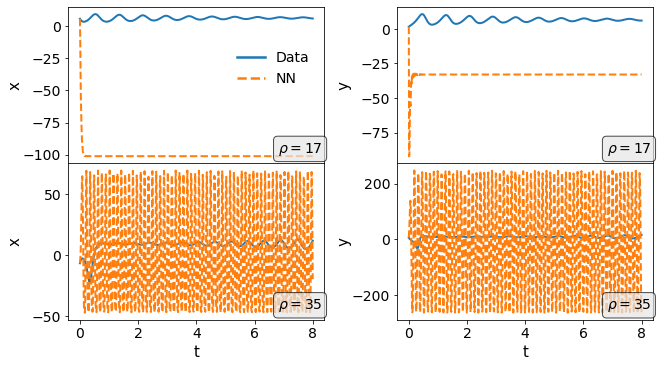

In [6]:
##  PREDICTION 2 - PLOT 1

X0 = dataset_p2['X0_check']
X = dataset_p2['X_nn_check']
X_pred = dataset_p2['X_nn_pred']
rho = [17,35]

fig_0, ax_0 = plt.subplots(X.shape[2],2,figsize=1.3*plt.figaspect(0.56), tight_layout=True, sharex='all', sharey='none' ,gridspec_kw={'hspace': 0})

for i in range(X.shape[2]):
    if i == 0:
        ax_0[i,0].plot(t, X[:,0,i], '-', linewidth=2, label='Data')
        ax_0[i,0].plot(t, X_pred[:,0,i], '--', linewidth=2, label='NN')
        ax_0[i,1].plot(t, X[:,1,i], '-', linewidth=2)
        ax_0[i,1].plot(t, X_pred[:,1,i], '--', linewidth=2)
        #ax_0[i,0].set_title('')
    else:
        ax_0[i,0].plot(t, X[:,0,i], '-', linewidth=2)
        ax_0[i,0].plot(t, X_pred[:,0,i], '--', linewidth=2)
        ax_0[i,1].plot(t, X[:,1,i], '-', linewidth=2)
        ax_0[i,1].plot(t, X_pred[:,1,i], '--', linewidth=2)
        
    
    ax_0[i,0].tick_params(axis='y', labelsize=14)
    ax_0[i,1].tick_params(axis='y', labelsize=14)
    ax_0[i,0].tick_params(axis='x', labelsize=14)
    ax_0[i,1].tick_params(axis='x', labelsize=14)
    ylim0 = ax_0[i,0].get_ylim()
    ylim1 = ax_0[i,1].get_ylim()
    ax_0[i,0].set_ylabel(ylabel='x', fontsize=15)
    ax_0[i,0].get_yaxis().set_label_coords(-0.18,0.5)
    ax_0[i,1].set_ylabel(ylabel='y', fontsize=15)
    ax_0[i,1].get_yaxis().set_label_coords(-0.18,0.5)
        
    ax_0[i,0].annotate(r'$\rho = {}$'.format(rho[i]), xy=(8, ylim0[0]), \
        xytext=(-35,11), textcoords='offset points',color='k', fontsize=14, fontweight='bold', bbox=dict(boxstyle="round", fc="0.9", alpha=0.7))
    ax_0[i,1].annotate(r'$\rho = {}$'.format(rho[i]), xy=(8, ylim1[0]), \
    xytext=(-35,11), textcoords='offset pixels',color='k', fontsize=14, fontweight='bold', bbox=dict(boxstyle="round", fc="0.9", alpha=0.7))

ax_0[1,0].set_xlabel(xlabel='t', fontsize=15)
ax_0[1,1].set_xlabel(xlabel='t', fontsize=15)
leg = fig_0.legend( loc=[0.35,0.75], framealpha=0.0, fontsize=14, shadow=False, fancybox=False, markerscale=1.5,) #bbox_to_anchor=[0, 1],
leg_lines = leg.get_lines()
plt.setp(leg_lines, linewidth=2.5)
#fig_0.savefig('..\\report_latex\\es3.1_prediction_2.eps', transaprent=True)


plt.show()

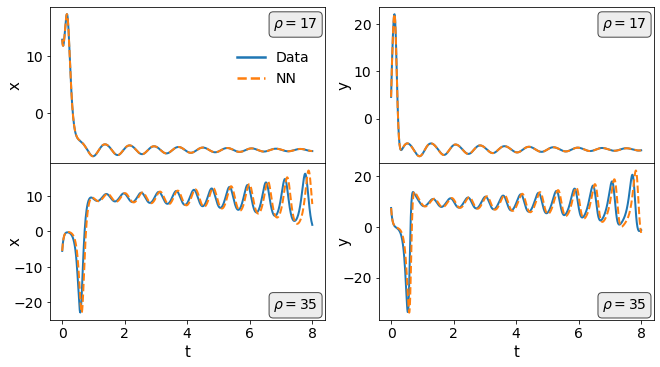

In [7]:
##  PREDICTION 2 - PLOT 2

X0 = dataset_p2_m['X0_check']
X = dataset_p2_m['X_nn_check']
X_pred = dataset_p2_m['X_nn_pred']
rho = [17,35]

fig_0, ax_0 = plt.subplots(X.shape[2],2,figsize=1.3*plt.figaspect(0.56), tight_layout=True, sharex='all', sharey='none' ,gridspec_kw={'hspace': 0})

for i in range(X.shape[2]):
    if i == 0:
        ax_0[i,0].plot(t, X[:,0,i], '-', linewidth=2, label='Data')
        ax_0[i,0].plot(t, X_pred[:,0,i], '--', linewidth=2, label='NN')
        ax_0[i,1].plot(t, X[:,1,i], '-', linewidth=2)
        ax_0[i,1].plot(t, X_pred[:,1,i], '--', linewidth=2)
        #ax_0[i,0].set_title('')
        ylim0 = ax_0[i,0].get_ylim()
        ylim1 = ax_0[i,1].get_ylim()
        ax_0[i,0].annotate(r'$\rho = {}$'.format(rho[i]), xy=(8, ylim0[1]), \
            xytext=(-39,-21), textcoords='offset points',color='k', fontsize=14, fontweight='bold', bbox=dict(boxstyle="round", fc="0.9", alpha=0.7))
        ax_0[i,1].annotate(r'$\rho = {}$'.format(rho[i]), xy=(8, ylim1[1]), \
            xytext=(-39,-21), textcoords='offset pixels',color='k', fontsize=14, fontweight='bold', bbox=dict(boxstyle="round", fc="0.9", alpha=0.7))        
    else:
        ax_0[i,0].plot(t, X[:,0,i], '-', linewidth=2)
        ax_0[i,0].plot(t, X_pred[:,0,i], '--', linewidth=2)
        ax_0[i,1].plot(t, X[:,1,i], '-', linewidth=2)
        ax_0[i,1].plot(t, X_pred[:,1,i], '--', linewidth=2)
        ylim0 = ax_0[i,0].get_ylim()
        ylim1 = ax_0[i,1].get_ylim()
        ax_0[i,0].annotate(r'$\rho = {}$'.format(rho[i]), xy=(8, ylim0[0]), \
            xytext=(-39,11), textcoords='offset points',color='k', fontsize=14, fontweight='bold', bbox=dict(boxstyle="round", fc="0.9", alpha=0.7))
        ax_0[i,1].annotate(r'$\rho = {}$'.format(rho[i]), xy=(8, ylim1[0]), \
            xytext=(-39,11), textcoords='offset pixels',color='k', fontsize=14, fontweight='bold', bbox=dict(boxstyle="round", fc="0.9", alpha=0.7))
        
    
    ax_0[i,0].tick_params(axis='y', labelsize=14)
    ax_0[i,1].tick_params(axis='y', labelsize=14)
    ax_0[i,0].tick_params(axis='x', labelsize=14)
    ax_0[i,1].tick_params(axis='x', labelsize=14)
    ax_0[i,0].set_ylabel(ylabel='x', fontsize=15)
    ax_0[i,0].get_yaxis().set_label_coords(-0.1,0.5)
    ax_0[i,1].set_ylabel(ylabel='y', fontsize=15)
    ax_0[i,1].get_yaxis().set_label_coords(-0.1,0.5)
        

ax_0[1,0].set_xlabel(xlabel='t', fontsize=15)
ax_0[1,1].set_xlabel(xlabel='t', fontsize=15)
leg = fig_0.legend( loc=[0.35,0.75], framealpha=0.0, fontsize=14, shadow=False, fancybox=False, markerscale=1.5,) #bbox_to_anchor=[0, 1],
leg_lines = leg.get_lines()
plt.setp(leg_lines, linewidth=2.5)
#fig_0.savefig('..\\report_latex\\es3.1_prediction_2_m.eps', transaprent=True)


plt.show()

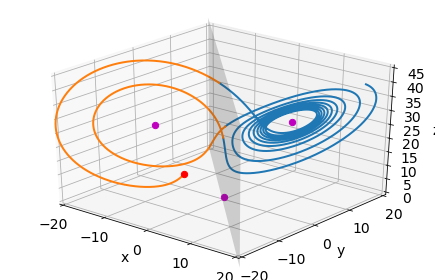

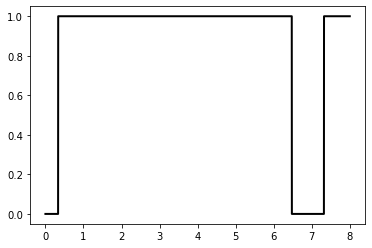

In [8]:
##  PART II - LABEL DEFINITION
dt = 0.001
t_end = 8
t = np.arange(0,t_end+dt,dt)

beta = 8/3
sigma = 10
rho = 28

build_dataset_2 = True
load_model_2 = True
n_train = 200
n_test = 20
n_f = 650

Xf1,Xf2,Xf3 = LorenzFixedPoints(sigma, beta, rho)
z_p, x_p = np.meshgrid(range(-3,47), range(-23,23))
y_p = -x_p

np.random.seed(1345)
X0 = -15 + 30 * np.random.random(3)

X_sol_ex2 = LorenzEquation(X0, t, sigma=sigma, beta=beta, rho=rho)
x_sol_ex2, y_sol_ex2, z_sol_ex2 = X_sol_ex2.T

ind1 = np.where(y_sol_ex2>-x_sol_ex2)
ind2 = np.where(y_sol_ex2<-x_sol_ex2)
par = np.ones_like(x_sol_ex2)
par[ind2[0]] = 0
ind1 = ind1[0]
ind2 = ind2[0]
indexes1 = [0]
indexes2 = [0]

for i in range(len(ind1)):
    if i < len(ind1)-1:
        if ind1[i+1]>ind1[i]+1:
            indexes1 = np.hstack((indexes1, i+1))
    else:
        indexes1 = np.hstack((indexes1, i+1))

ind_list_1 = [ind1[indexes1[k]:indexes1[k+1]] for k in range(len(indexes1)-1)]

for i in range(len(ind2)):
    if i < len(ind2)-1:
        if ind2[i+1]>ind2[i]+1:
            indexes2 = np.hstack((indexes2, i+1))
    else:
        indexes2 = np.hstack((indexes2, i+1))

ind_list_2 = [ind2[indexes2[k]:indexes2[k+1]] for k in range(len(indexes2)-1)]


fig_0 = plt.figure(figsize=plt.figaspect(0.65), tight_layout=True)
ax0 = fig_0.add_subplot(111, projection='3d')
[ax0.plot(x_sol_ex2[ind_list_1[k]], y_sol_ex2[ind_list_1[k]], z_sol_ex2[ind_list_1[k]], '-',linewidth=2, color='C0') for k in range(len(ind_list_1))]
[ax0.plot(x_sol_ex2[ind_list_2[k]], y_sol_ex2[ind_list_2[k]], z_sol_ex2[ind_list_2[k]], 'r-',linewidth=2, color='C1') for k in range(len(ind_list_2))]
ax0.scatter(X0[0],X0[1],X0[2],color='r',s=40)
ax0.scatter(Xf1[0],Xf1[1],Xf1[2],color='m',s=40)
ax0.scatter(Xf2[0],Xf2[1],Xf2[2],color='m',s=40)
ax0.scatter(Xf3[0],Xf3[1],Xf3[2],color='m',s=40)
#ax0.plot_surface(x_e, y_e, z_e, color='r', alpha=0.2)
ax0.plot_surface(x_p, y_p, z_p, linewidth=0, rcount=1, ccount=1, color='grey', alpha=0.2)
ax0.view_init(elev=30, azim=-50)
ax0.set_xlabel(xlabel='x', fontsize=14)
ax0.set_ylabel(ylabel='y', fontsize=14)
ax0.set_zlabel(zlabel='z', fontsize=14)
ax0.tick_params(axis='x', labelsize=14)
ax0.tick_params(axis='y', labelsize=14)
ax0.tick_params(axis='z', labelsize=14)
ax0.set_yticks([-20,-10,0,10,20])
ax0.set_xticks([-20,-10,0,10,20])
ax0.set_xlim([-20,20])
ax0.set_ylim([-20,20])
ax0.set_zlim([0,45])
#fig_0.savefig('..\\report_latex\\es3.2_label_def.svg', transaprent=True)

fig_2, ax_2 = plt.subplots()
ax_2.plot(t, par, 'k-', linewidth=2)

plt.show()



In [9]:
##  BUILD DATASET

def buildSecondDataset (X0, t, n_train, n_test):
    
    n_ti = len(t)
    n_t = n_ti-n_f
    n_nn = n_train+n_test
    n_tot = n_nn
    
    np.random.seed(123)
    X0_nn = -15 + 30 * np.random.random((n_tot,3))

    dataset = np.zeros((n_tot*n_t,3))
    label = np.zeros((n_tot*n_t,1))    
    for i in range(n_tot):

        X_nn_2 = LorenzEquation(X0_nn[i,:], t, sigma=sigma, beta=beta, rho=rho)
        x_nn_2, y_nn_2, z_nn_2 = X_nn_2.T
        ind1 = np.where(y_nn_2>-x_nn_2)
        ind2 = np.where(y_nn_2<-x_nn_2)
        par = np.ones_like(t)
        par[ind2[0]] = 0
        PAR = par.reshape((-1,1))
        dataset[i*n_t:(i+1)*n_t,:] = X_nn_2[:-n_f,:]
        label[i*n_t:(i+1)*n_t] = PAR[n_f:]

    train_dataset = dataset[:n_train*n_t,:]
    train_label = (label[:n_train*n_t]).reshape((-1,))
    test_dataset = dataset[n_train*n_t:,:]
    test_label = (label[n_train*n_t:]).reshape((-1,))

    with open(os.path.join(es3_p2_dir, 'train.pkl'), 'wb') as f:
                pickle.dump([train_dataset, train_label], f)

    with open(os.path.join(es3_p2_dir, 'test.pkl'), 'wb') as f:
                pickle.dump([test_dataset, test_label], f)

    return train_dataset, train_label, test_dataset, test_label

try:
    open(os.path.join(es3_p2_dir, 'train.pkl'))
    open(os.path.join(es3_p2_dir, 'test.pkl'))
except FileNotFoundError:
    build_dataset_2 = True


if build_dataset_2 == True:
    
    train_dataset, train_label, test_dataset, test_label = buildSecondDataset(X0, t, n_train, n_test)

else:
    
    with open(os.path.join(es3_p2_dir, 'train.pkl'), 'rb') as f:
            train = pickle.load(f)
            train_dataset, train_label = train[0], train[1]
    with open(os.path.join(es3_p2_dir, 'test.pkl'), 'rb') as f:
            test = pickle.load(f)
            test_dataset, test_label = test[0], test[1]





In [10]:
##  DEFINE NN

results_2_dir = os.path.join(es3_p2_dir, 'es3_partII_NN_models')
prediction_dir = os.path.join(es3_p2_dir, 'results')

if not os.path.exists(results_2_dir):
    os.makedirs(results_2_dir)

if not os.path.exists(prediction_dir):
    os.makedirs(prediction_dir)

name = 'NN_model_Nf' + str(n_f) + '.h5'
name_2 = 'NN_model_Nf' + str(n_f) + '.pkl'
result_2_file_name = os.path.join(results_2_dir, name)
prediction_name = os.path.join(prediction_dir, name_2)

NNinput = train_dataset
NNoutput = train_label

def build_model_2():
    inputs = keras.Input(shape=(NNinput.shape[1],), name="digits")
    l1 = layers.Dense(32, activation="relu", name="dense_1")(inputs)
    l1 = layers.Dense(32, activation="relu", name="dense_2")(l1)
    l1 = layers.Dense(32, activation="relu", name="dense_3")(l1)
    outputs = layers.Dense(2, activation="softmax", name="predictions")(l1)
    
    model = keras.Model(inputs=inputs, outputs=outputs)

    optimizer = tf.keras.optimizers.RMSprop(0.001)
    
    model.compile(optimizer=optimizer,  # Optimizer
        # Loss function to minimize
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        # List of metrics to monitor
        metrics=[tf.keras.metrics.SparseCategoricalAccuracy()]
        )
    return model

def build_restore_model_2():
    if load_model_2 == False or not os.path.exists(result_2_file_name):
        print("Creating a new model")
        return build_model_2()
    else:
        return tf.keras.models.load_model(result_2_file_name)

model = build_restore_model_2()



In [11]:
##  TRAIN NN

EPOCHS = 10
example_input = NNinput[:5,:]
example_output = model.predict(example_input)


if load_model_2 == False or not os.path.exists(result_2_file_name):
    history = model.fit(
        NNinput, NNoutput,
        epochs=EPOCHS, validation_split = 0.2,
        batch_size=150)

model.save(result_2_file_name)


In [12]:
##  PREDICTION AND PERFORMANCE

test_sol = model.evaluate(test_dataset, test_label, verbose=2)
test_loss = test_sol[0]
print("Testing set Mean Square Error: {:5.5f}".format(test_loss))

np.random.seed(323)
X0_check_2 = -15 + 30 * np.random.random(3)

X_sol_chek_2 = LorenzEquation(X0_check_2, t, sigma=sigma, beta=beta, rho=rho)
x_sol_check_2, y_sol_check_2, z_sol_check_2 = X_sol_chek_2.T
ind1 = np.where(y_sol_check_2>-x_sol_check_2)
ind2 = np.where(y_sol_check_2<-x_sol_check_2)
par = np.ones_like(x_sol_check_2)
par[ind2[0]] = 0

label_pred = model.predict(X_sol_chek_2)
label_pred = np.round(label_pred)

par_pred_long = np.where(label_pred>0)[1]
par_pred = par_pred_long[:-n_f]
incipit = par_pred[0]*np.ones(n_f)
par_pred = np.hstack((incipit, par_pred))

transition = np.zeros_like(par)
for i in range(1,len(par)-1):
    if par[i+1]!=par[i]:
        transition[i] = 1
transition[0] = transition[1]
transition[-1] = transition[-2]

transition_pred = np.zeros_like(par_pred)
for i in range(1,len(par_pred)-1):
    if par_pred[i+1]!=par_pred[i]:
        transition_pred[i] = 1
transition_pred[0] = transition_pred[1]
transition_pred[-1] = transition_pred[-2]

with open(prediction_name, 'wb') as f:
                    pickle.dump([transition, transition_pred] , f)


4595/4595 - 6s - loss: 0.2256 - sparse_categorical_accuracy: 0.9473
Testing set Mean Square Error: 0.22558


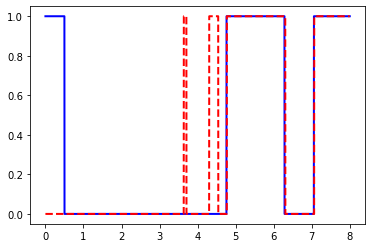

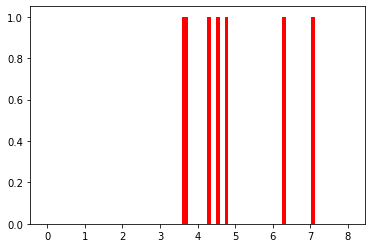

In [13]:

fig_3, ax_3 = plt.subplots()
ax_3.plot(t, par, 'b-', linewidth=2)
ax_3.plot(t,par_pred, 'r--', linewidth=2)

fig = plt.figure()
plt.bar(t, transition_pred, 0.1, bottom=0, color='red')


plt.show()

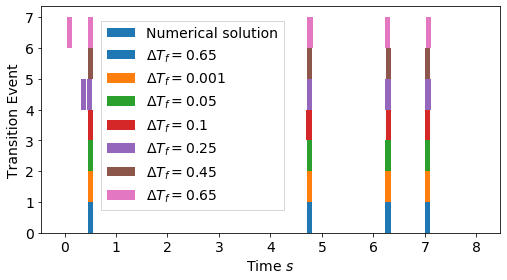

In [14]:
##  FINAL PLOT

names_to_import = [os.path.join(prediction_dir, k) for k in os.listdir(prediction_dir)]

transition_pred_part = np.zeros((len(t),len(names_to_import)))
for i, nm in enumerate(names_to_import):
    with open(nm, 'rb') as f:
                    transitions = pickle.load(f)
                    transition_pred_part[:,i] = transitions[1]
                    transition = transitions[0]

indexes_tr = [0,5,10,19,29,-1]
transition_pred_part = transition_pred_part[:,indexes_tr]
transition_pred_full = np.hstack((transition.reshape((-1,1)), transition_pred_part))

y_offset = 0
colors = ['C0','C1','C2','C3','C4','C5','C6']
n_f_p = np.array([1,50,100,250,450,650])
DT = dt*n_f_p

fig, ax = plt.subplots(figsize=plt.figaspect(0.56), tight_layout=True)
for row in range(transition_pred_full.shape[1]):
    if row ==0:
        ax.bar(t, transition_pred_full[:,row], 0.1, bottom=y_offset, color=colors[row], label='Numerical solution')
    ax.bar(t, transition_pred_full[:,row], 0.1, bottom=y_offset, color=colors[row], label=r'$\Delta T_f = {}$'.format(DT[row-1]))
    y_offset = y_offset + 1

ax.set_ylabel(ylabel='Transition Event', fontsize=14)
ax.set_xlabel(xlabel=r'Time $s$', fontsize=14)

ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
leg = fig.legend( loc=[0.20,0.25], fontsize=14,  fancybox=False) #bbox_to_anchor=[0, 1],
#fig.savefig('..\\report_latex\\es3.2_transition.eps', transaprent=True)
